# Systemy inspekcji wizualnej  
## Laboratorium  5 - Filtracja i wykrywanie krawędzi
dr inż. Łukasz Jeleń

Nazwisko i Imię:  Michał Dams  
Nr albumu:  246783  
data wykonania ćwiczenia:  16.12.2022  

# 1. Narzędzia  
  
  
Na zjęciach korzystamy z pythnona, a jako środowisko pracy mają Państwo do wyboru Google Colab (https://colab.research.google.com) - wersja online, lub Anaconda Navigator (https://www.anaconda.com/) - wymaga instalacji na własnym komputerze. Są to oczywiście tylko propozycje. 

# 2. Zadania. 
  
## Zadanie 1 - Dodawanie szumu do obrazów. 
  

2 dowolnie wybranye obrazy pozyskane w trakcie laboratorium 2 zamień na obrazy monochromatyczne oraz wykonaj poniższe polecenia. 

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import random

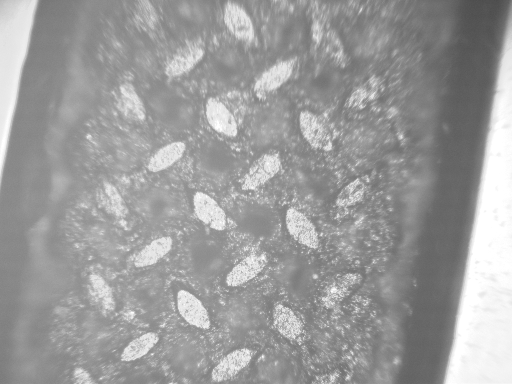

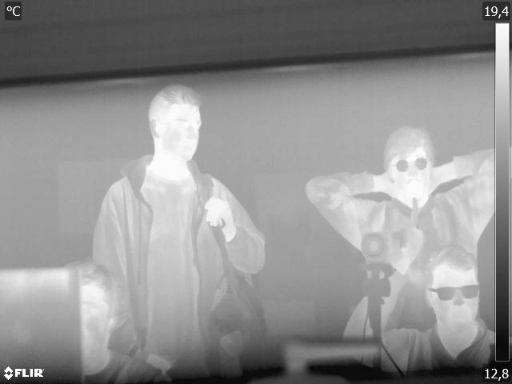

In [ ]:
dsize = (512, 384)
img_1 = cv2.resize(cv2.imread('/content/mikroskop.png', cv2.IMREAD_GRAYSCALE), dsize)
img_2 = cv2.resize(cv2.imread('/content/termowizja.jpg', cv2.IMREAD_GRAYSCALE), dsize)
cv2_imshow(img_1)
cv2_imshow(img_2)

### a) Szum addytywny  
  
Szum addytywny oddziałuje na każdy piksel w obrazie według zależności: $y_{ij}= f_{ij}+ ϵ_{ij}$, gdzie $ϵ_{ij}$ to szum o rzkładzie Gaussa $N(0, σ)$.  
  
Należy dodać szum do wybranych 2 obrazów dla 5 różnych wartości $σ$.

In [ ]:
def add_gauss_noise(image, s):
  row,col = image.shape
  mean = 0
  var = 10
  sigma = var**s
  gauss = np.random.normal(mean,sigma,(row,col))
  gauss = gauss.reshape(row,col)
  noisy = image + gauss
  return noisy


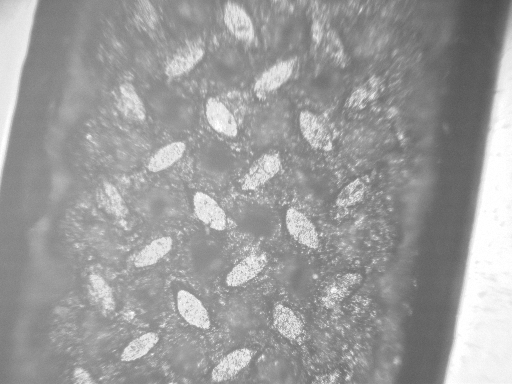

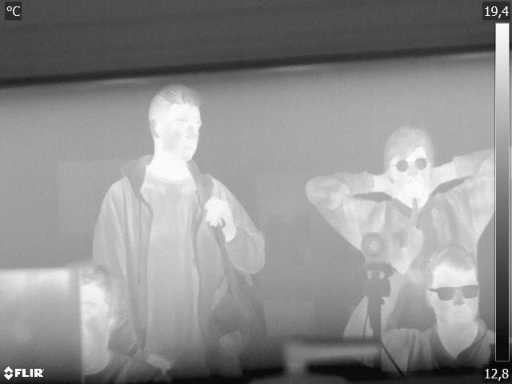

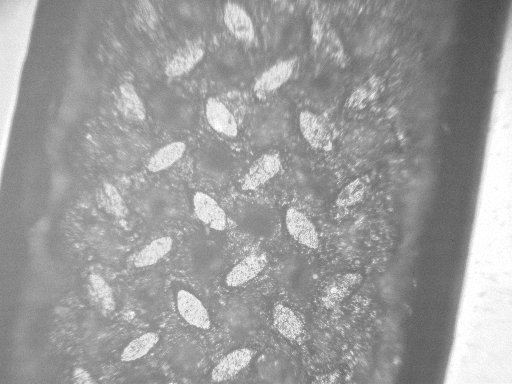

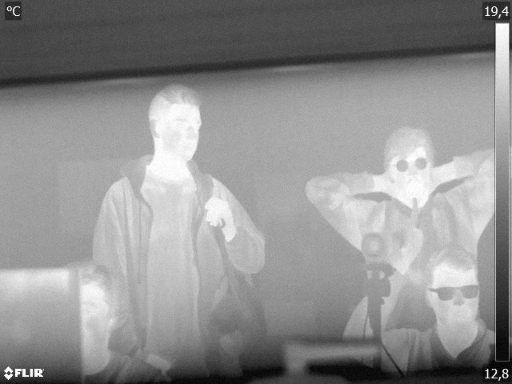

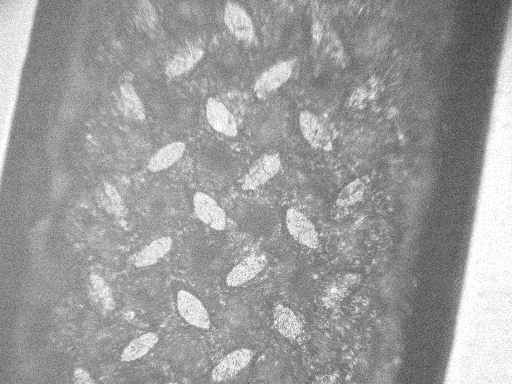

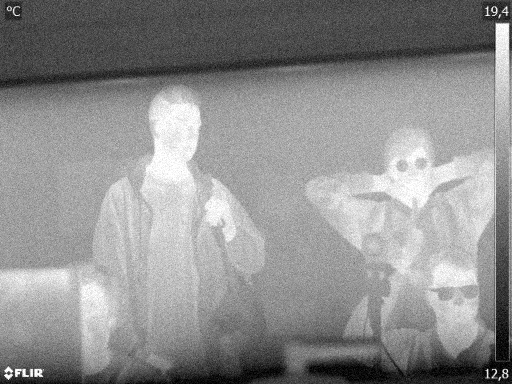

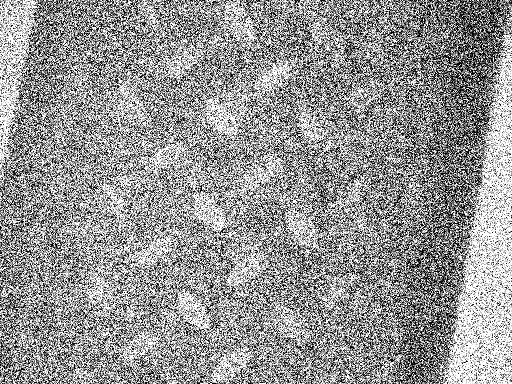

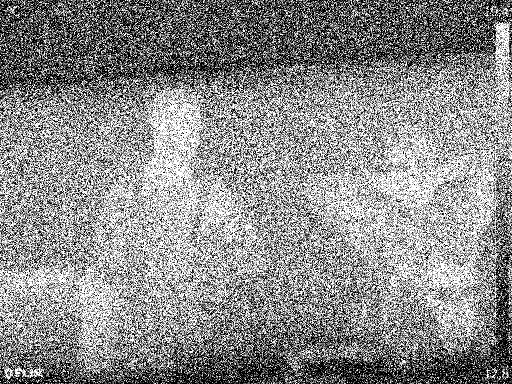

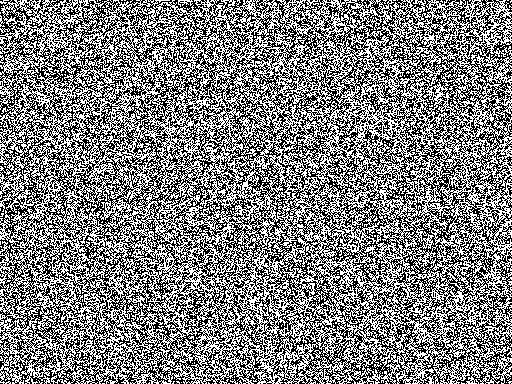

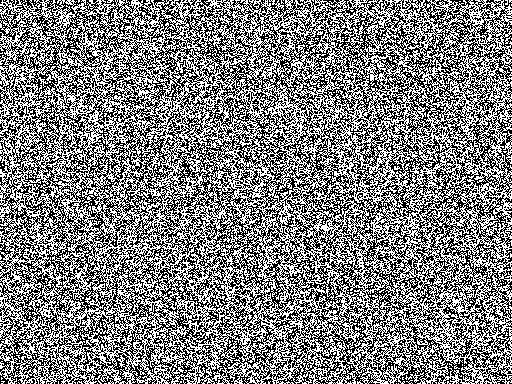

In [ ]:
sigma_list = [0.2, 0.5, 1.0, 2.0, 5.0]
for sigma in sigma_list:
  noisy_img_1 = add_gauss_noise(img_1, sigma)
  noisy_img_2 = add_gauss_noise(img_2, sigma)
  cv2_imshow(noisy_img_1)
  cv2_imshow(noisy_img_2)

Szum gaussa obecny jest na całym obrazie już przy małej watości parametru sigma (dotyka każdego piksela). Początkowo (mała wartość sigmy) szum jest ledwo widoczny. Wraz ze wzrostem wartości parametru szum staje się coraz bardziej wyraźny. Przy wartości sigmy = 5.0 obraz staje się całkowicie nierozpoznawalny, jedyne co widać to szum.

### b) Szum Poissona   
  
  Szum Poissona jest otrzymywany przez zastąpienie wartości oryginalnej $f_{ij}$ przez wartość losową o rozkładzie Poissona.  

Należy dodać szum Poissona do 2 wybranych obrazów sla 5 różnych wartości parametru $λ$.

In [ ]:
def add_poison_noise(image, l): 
  row,col = image.shape
  poisson = np.random.poisson(l, (row, col))
  return poisson + image

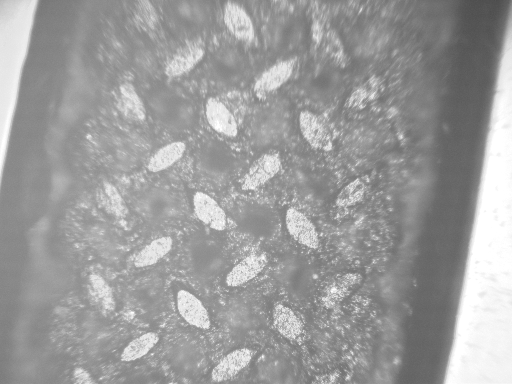

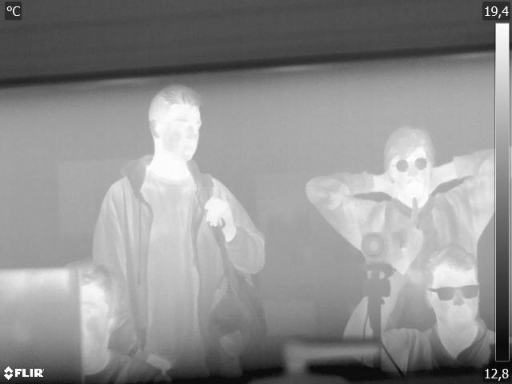

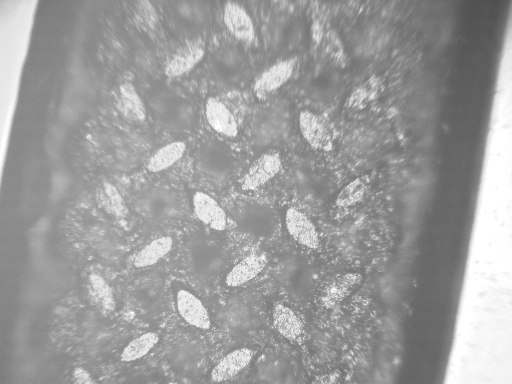

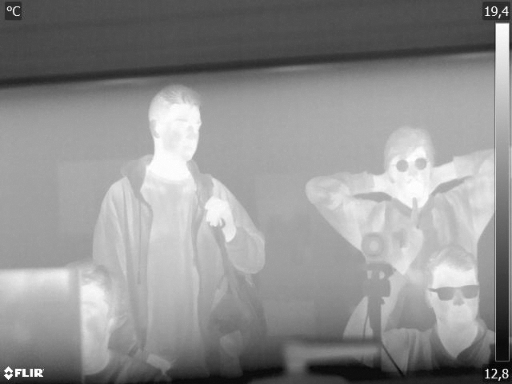

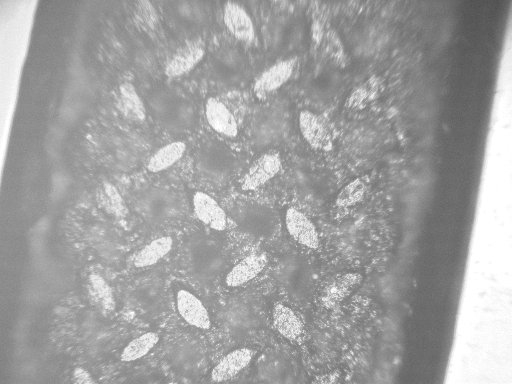

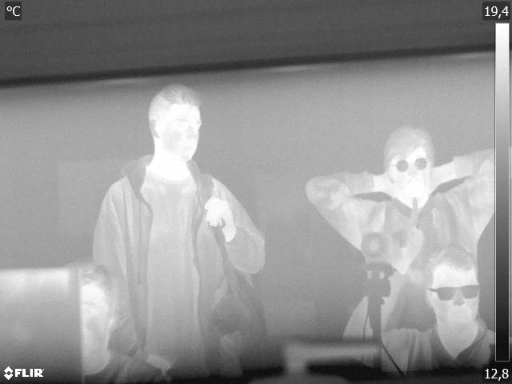

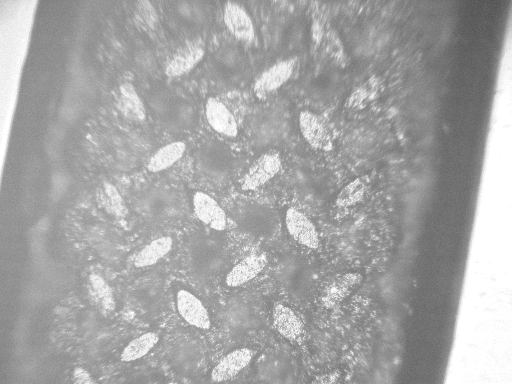

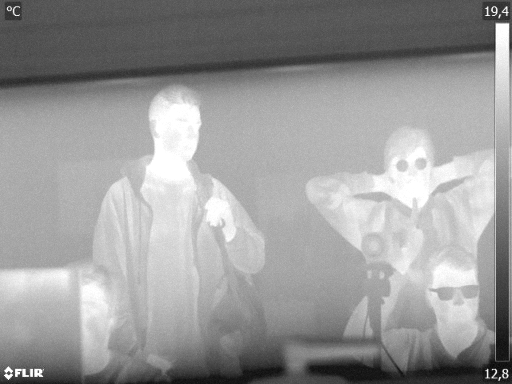

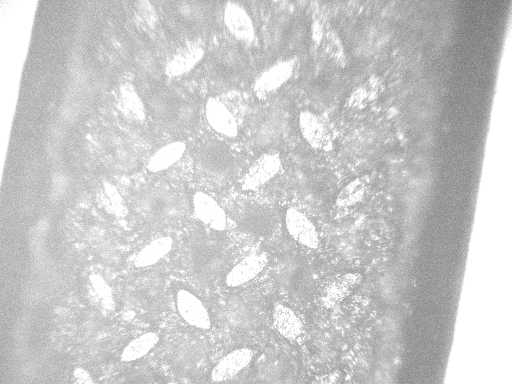

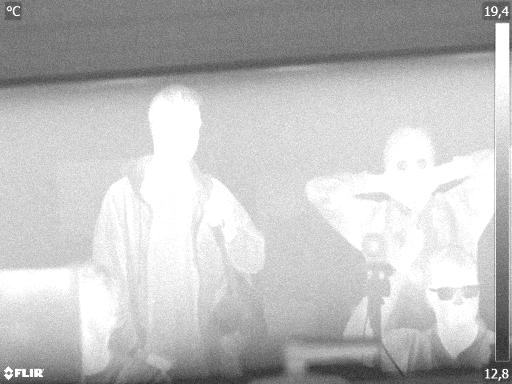

In [ ]:
lambda_list = [0.5, 1.0, 5.0, 10.0, 50.0]
for l in lambda_list:
  noisy_img_1 = add_poison_noise(img_1, l)
  noisy_img_2 = add_poison_noise(img_2, l)
  cv2_imshow(noisy_img_1)
  cv2_imshow(noisy_img_2)

OPisz swoje spostrzeżenia

Szum Poissona powiązany jest z intensywnością światła. Wraz ze zwiększaszniem się wartości parametru lambda obrazy robią się jaśniejsze. Wraz ze wzrostem jasności zatraca się ilość informacji na obrazie - robią się one mniej szczegółówe.

### c) Szum Salt and Pepper. 
  
Szum w którym określona ilość pikselii jest zamieniana według rozkładu jednostajnego i ich wartość $f_{ij}$ jest zamieniana na 0 (czarny) lub biały (255) z prawdopodobieństwem $\frac{1}{2}$.  
  
Należy dodać szum Salt and Pepper do 2 wybranych obrazów dla 5%, 15%, 25%, 35% i 50% pikseli zamienionych na biały i/lub czarny.  


In [ ]:
def sp_noise(image,prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob/2 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob/2:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

Probability = 5.0 %


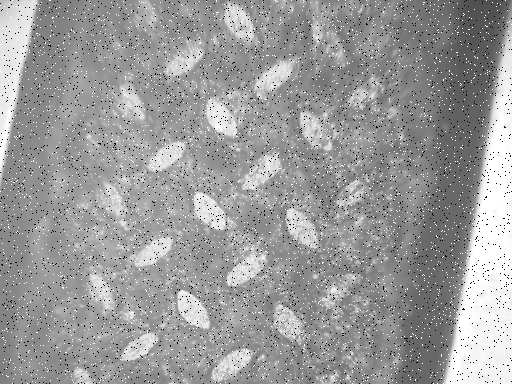

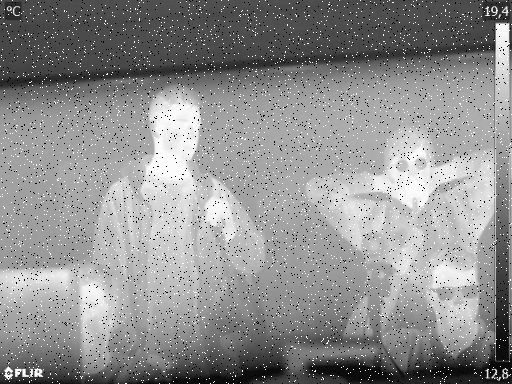




Probability = 15.0 %


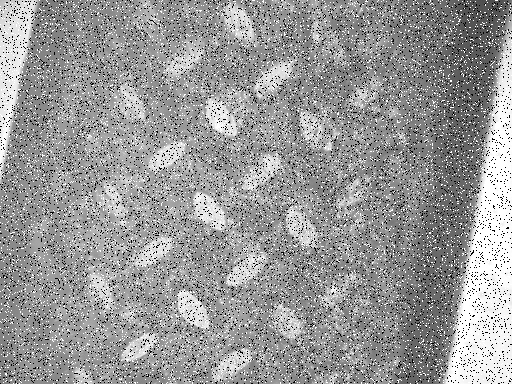

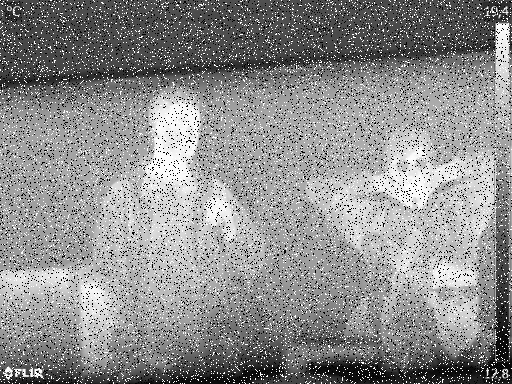




Probability = 25.0 %


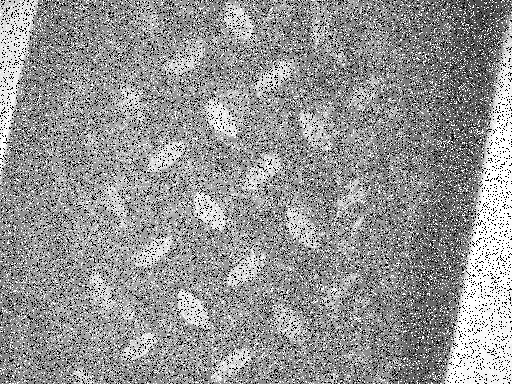

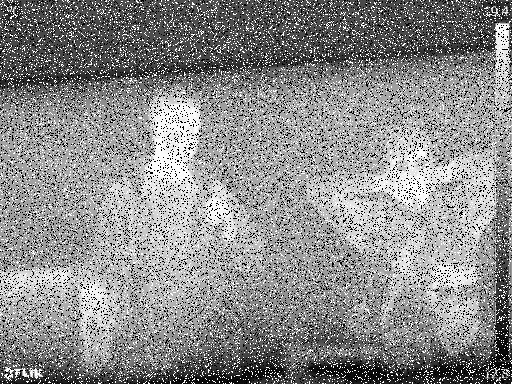




Probability = 35.0 %


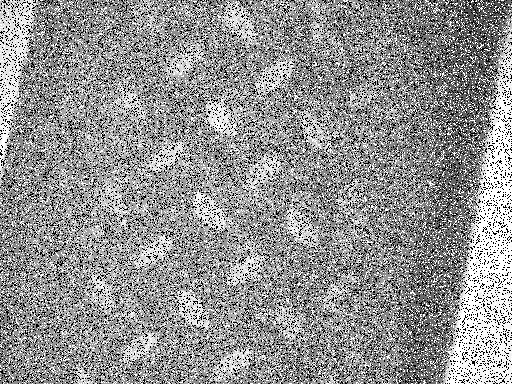

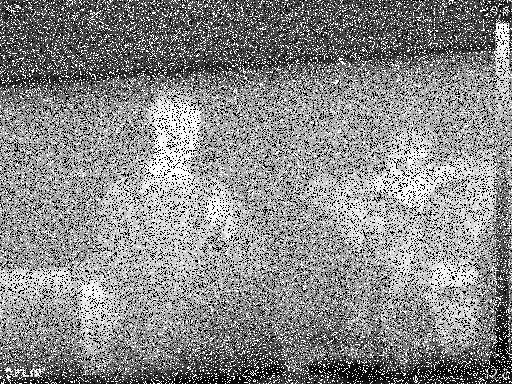




Probability = 50.0 %


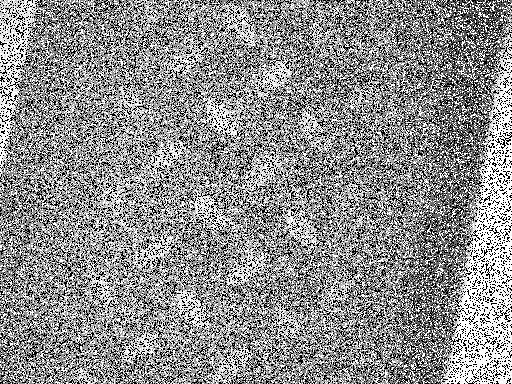

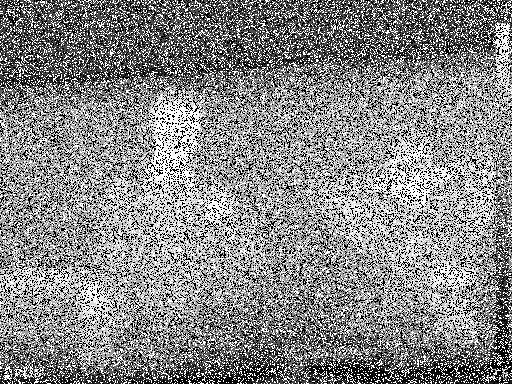

In [ ]:
prob_list = [0.05, 0.15, 0.25, 0.35, 0.5]
for prob in prob_list:
  print(f"Probability = {prob*100} %")
  noise_img = sp_noise(img_1, prob)
  cv2_imshow(noise_img)
  noise_img = sp_noise(img_2, prob)
  cv2_imshow(noise_img)
  print('\n\n')

Szum salt and pepper zastępuje wartości losowych pikseli wartościami 0 lub 255 (czarny lub biały). Parametr probability wpływa na liczbę pikseli które zostaną zmodyfikowane. Dla prob = 5% obraz jest całkowicie rozpoznawalny, szum jest wyraźny, lecz jest go na tyle mało że nie przeszkadza człowiekowi w rozpoznaniu obiektów na obrazie. Wraz ze wzrostem parametru 'probability' szumu jest coraz więcej. Przy wartości 50% praktycznie nie da się rozpoznać co znajduje się na obrazie.

## Zadanie 2 - Filtrowanie

Dla obrazów otrymanyh w zadaniu 1 oraz obrazu stworzonego na pierwszym laboratorium (obraz z liniami z dodanym szumem) wykonaj poniższe zadania. 
  
### a) Filtr Butterworth. 
  
Zastosuj filrt Butterworth do wszystkich obrazów


gauss_1


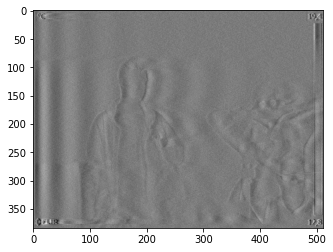


gauss_2


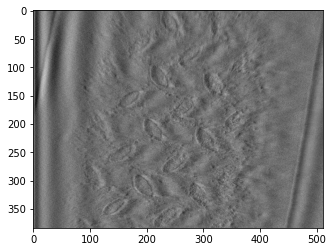


poisson_1


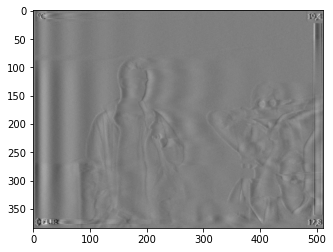


poisson_2


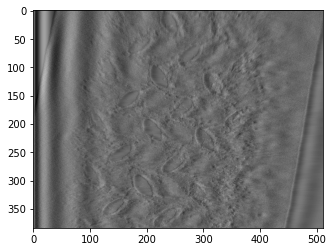


sp_1


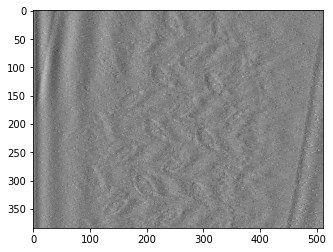


sp_2


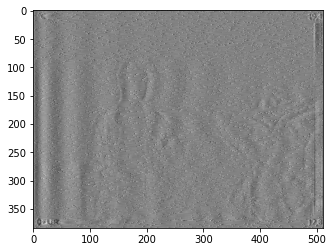


lab1_zdjecie


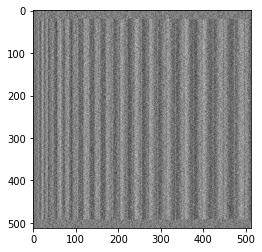

In [ ]:
from scipy import signal, ndimage, misc
import matplotlib.pyplot as plt
import imageio
from PIL import Image

file_names = ['gauss_1', 'gauss_2', 'poisson_1', 'poisson_2', 'sp_1', 'sp_2', 'lab1_zdjecie']
for f in file_names:
  print(f'\n{f}')
  path = r"/content/" + f + ".png"
  image = Image.open(path).convert('L')
  sos = signal.butter(10, 15, 'hp', fs=1000, output='sos')
  image = signal.sosfilt(sos, image)
  plt.imshow(image, cmap = plt.cm.gray) 
  plt.show()

Opisz swoje spostrzeżenia

Po zastosowaniu filtru szum stał się dużo mniej widoczny. Jednocześnie obrazy stały się dużo mniej przejrzyste. Z obrazów wybijają się głównie krawędzie, a szczegóły stały się niewidoczne

### b) Filtr Gaussowski. 
  
Zastosuj filrt Gaussowski do wszystkich obrazów dla 3 różnych warotści $σ$

Sigma = 1

gauss_1


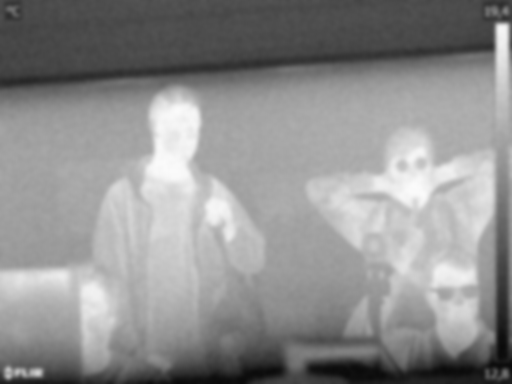


gauss_2


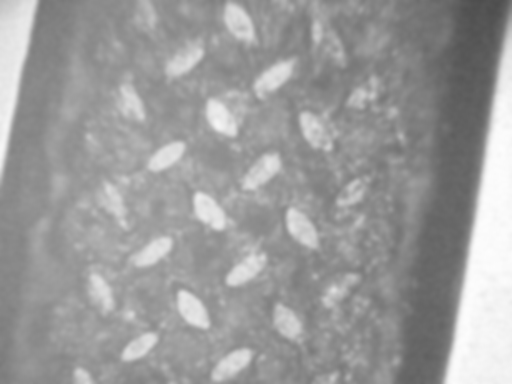


poisson_1


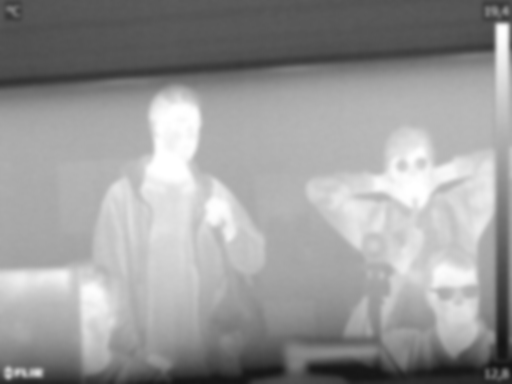


poisson_2


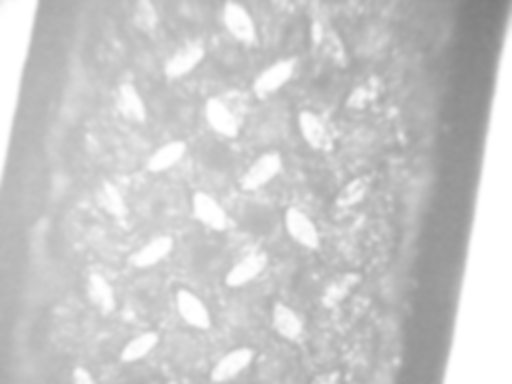


sp_1


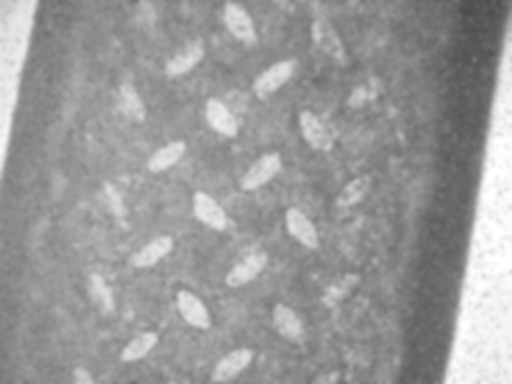


sp_2


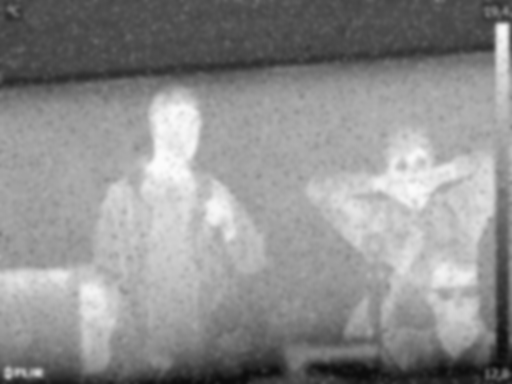


lab1_zdjecie


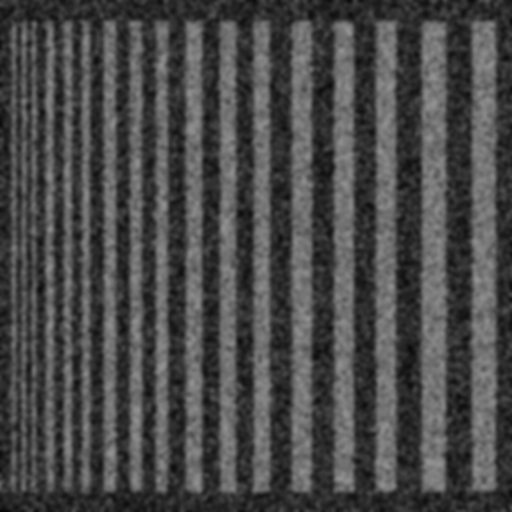





Sigma = 5

gauss_1


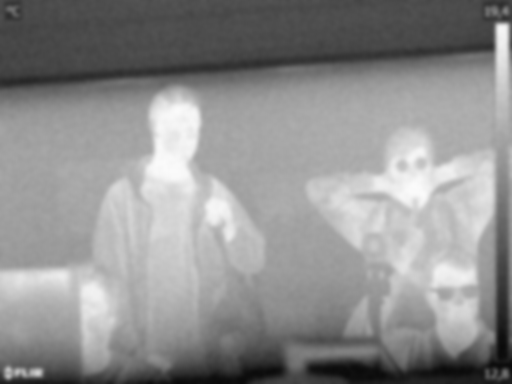


gauss_2


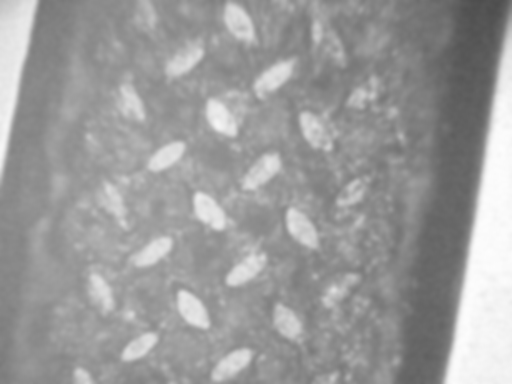


poisson_1


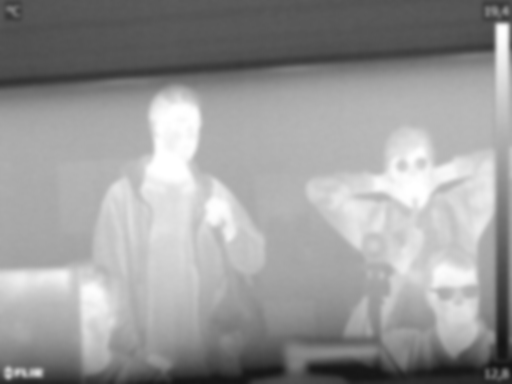


poisson_2


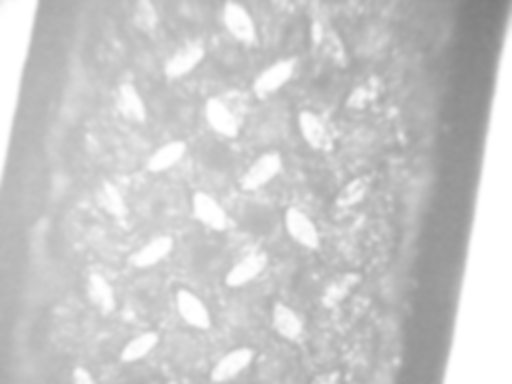


sp_1


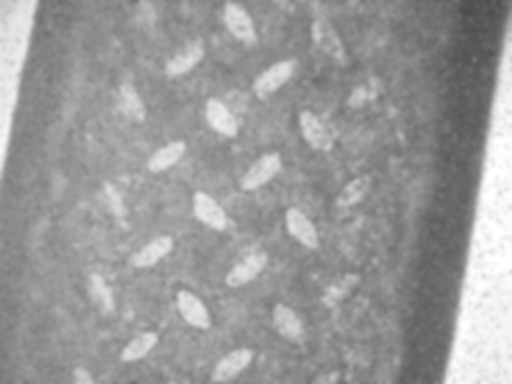


sp_2


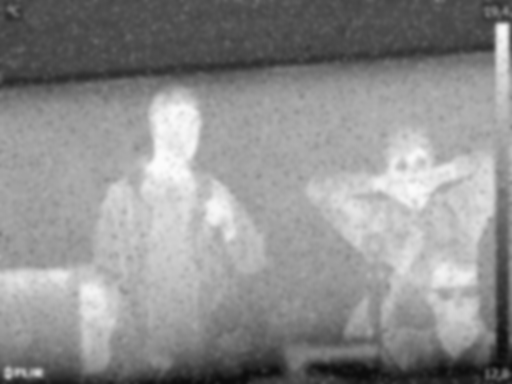


lab1_zdjecie


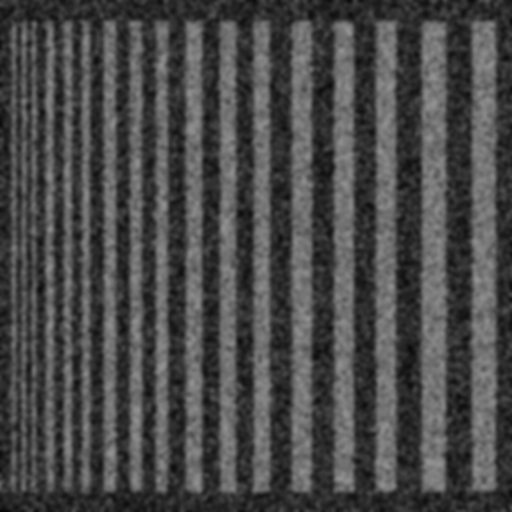





Sigma = 10

gauss_1


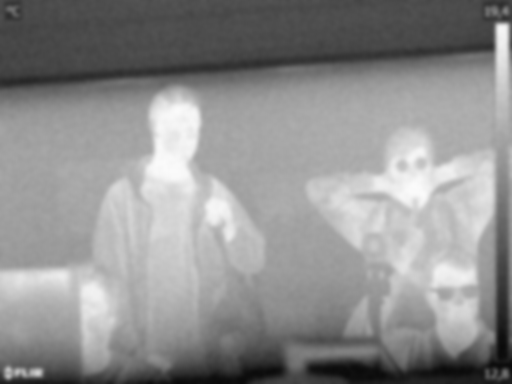


gauss_2


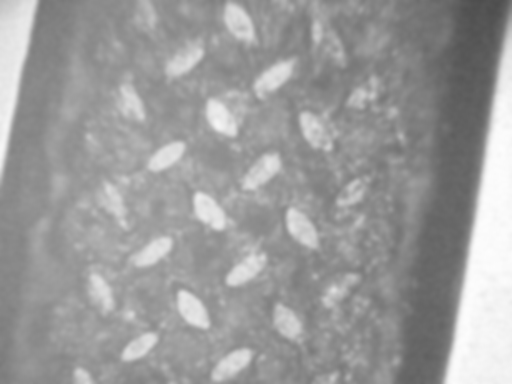


poisson_1


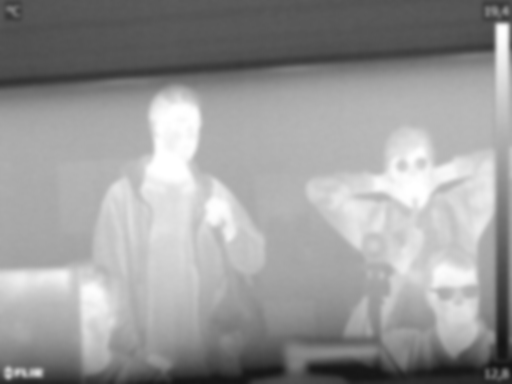


poisson_2


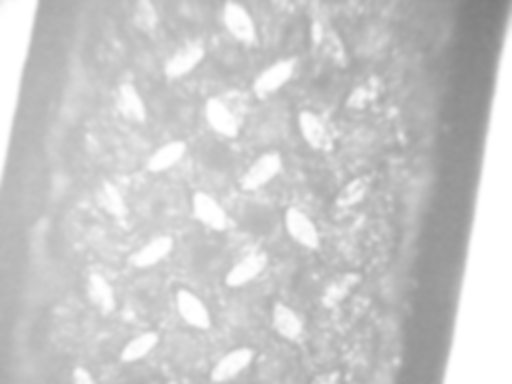


sp_1


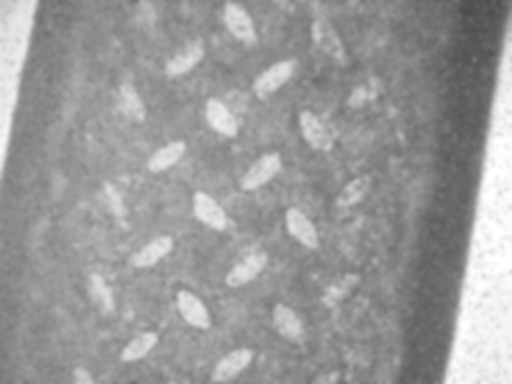


sp_2


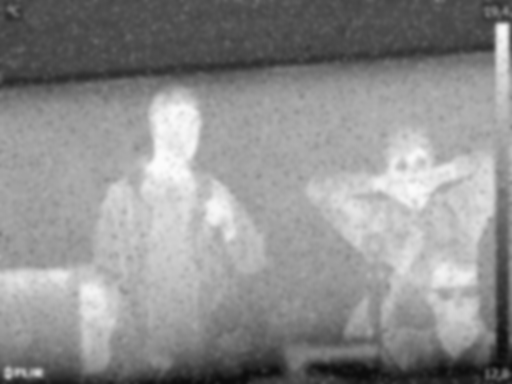


lab1_zdjecie


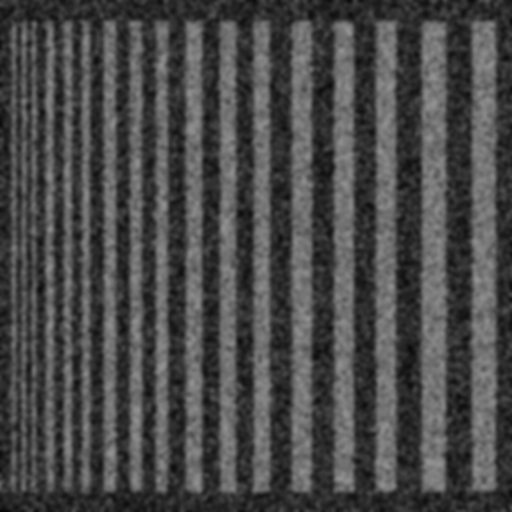

In [ ]:
from PIL import Image, ImageFilter

sigma_values = [1, 5, 10]
file_names = ['gauss_1', 'gauss_2', 'poisson_1', 'poisson_2', 'sp_1', 'sp_2', 'lab1_zdjecie']
for l in sigma_values:
  print(f'Sigma = {l}')
  for f in file_names:
    print(f'\n{f}')
    path = r"/content/" + f + ".png"
    image = Image.open(path)
    image = image.filter(ImageFilter.GaussianBlur)
    display(image)
  print('\n\n\n')

Po zastosowaniu filtra gaussa obrazy sprawiają wrażenie rozmazanych. Filtr podziałał jak tzw. blur. Im większa wartość współczynnika sigma, tym efekt stawał się mocniejszy. Krawędzie stały się mocno rozmyte.

### c) Filtr Medianowy. 
  
Zastosuj filrt Medianowy do wszystkich obrazów dla 3 wartości okna (5x5, 11x11, 21x21)

Kernel size = 5x5

gauss_1


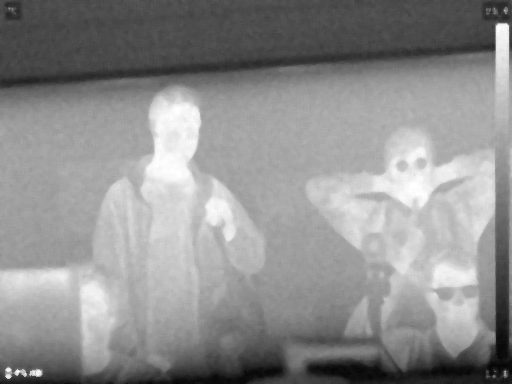


gauss_2


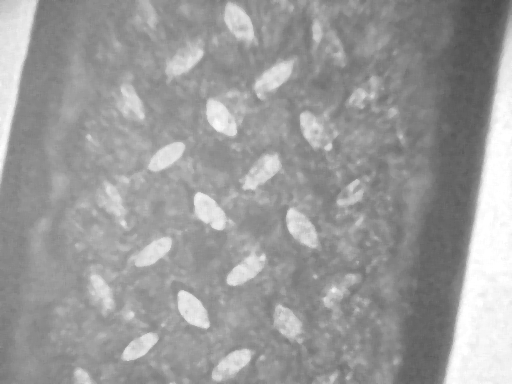


poisson_1


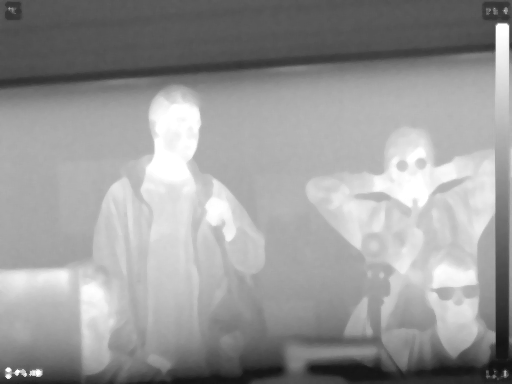


poisson_2


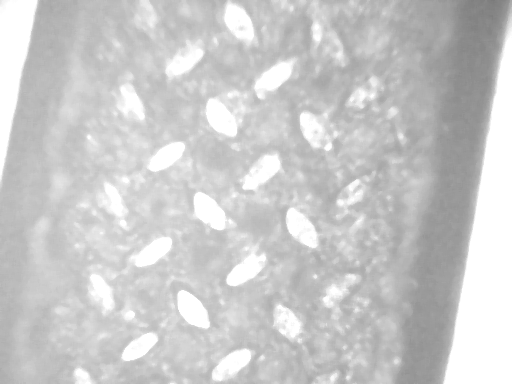


sp_1


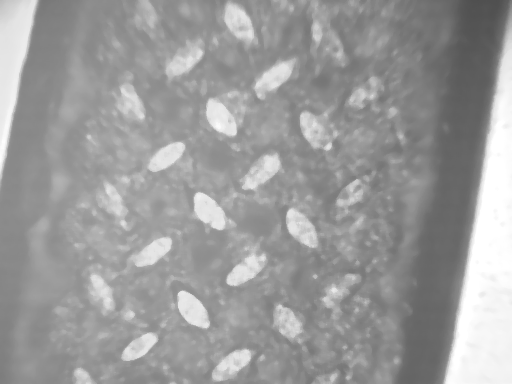


sp_2


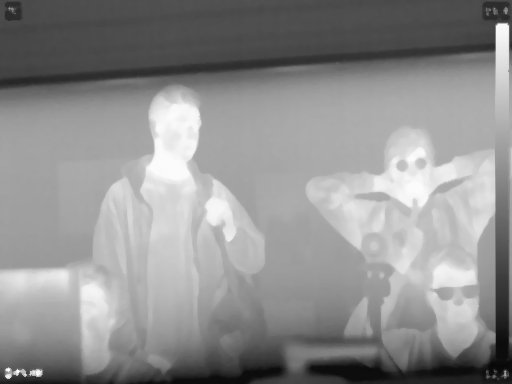


lab1_zdjecie


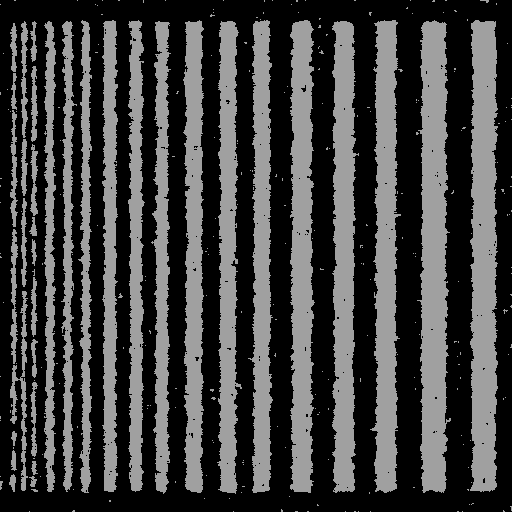





Kernel size = 11x11

gauss_1


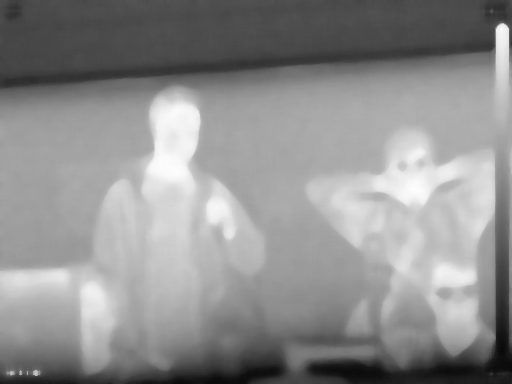


gauss_2


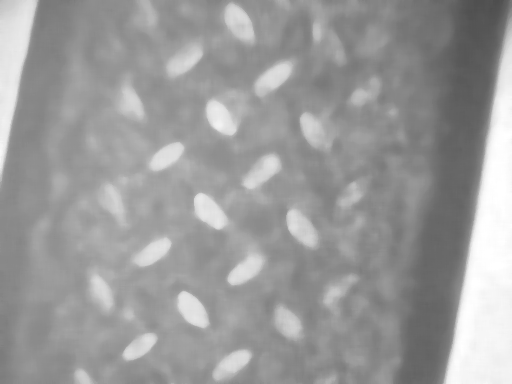


poisson_1


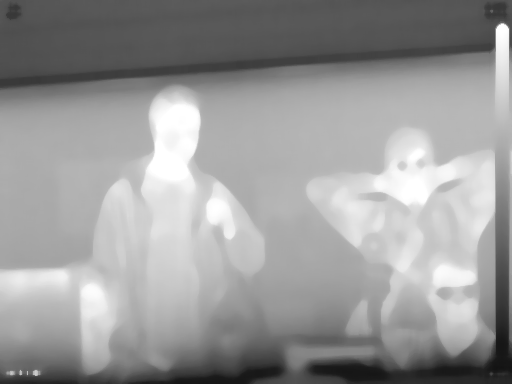


poisson_2


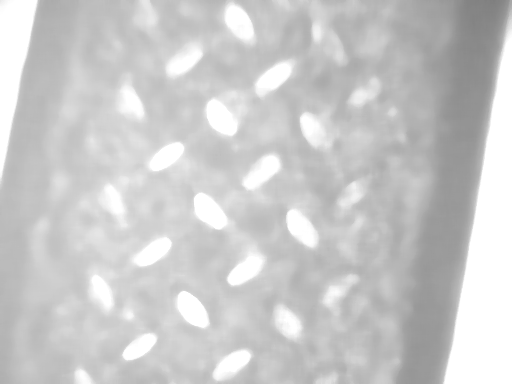


sp_1


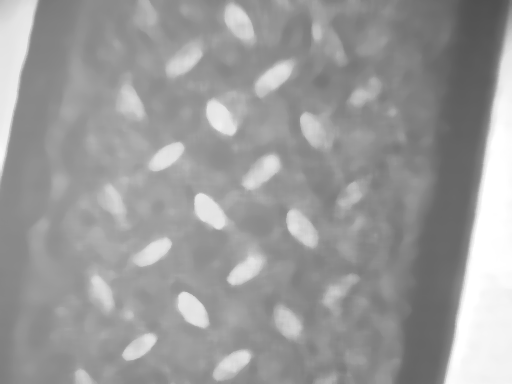


sp_2


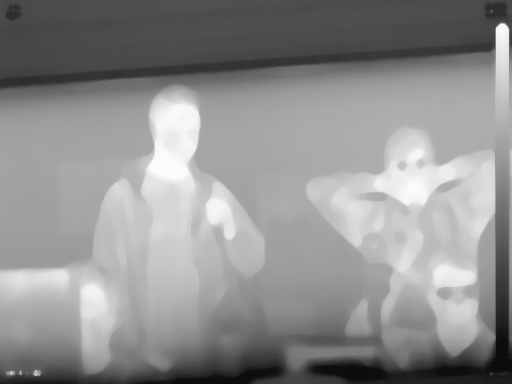


lab1_zdjecie


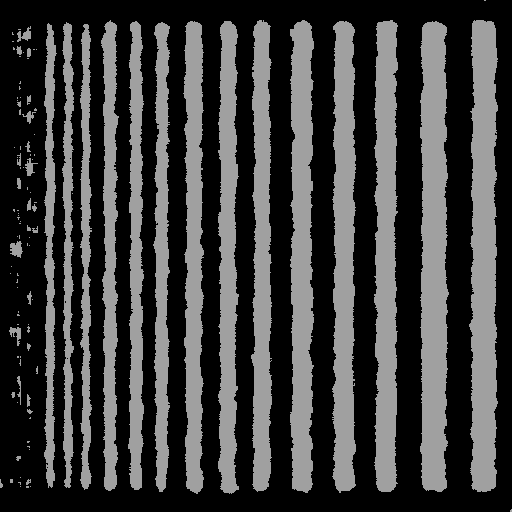





Kernel size = 21x21

gauss_1


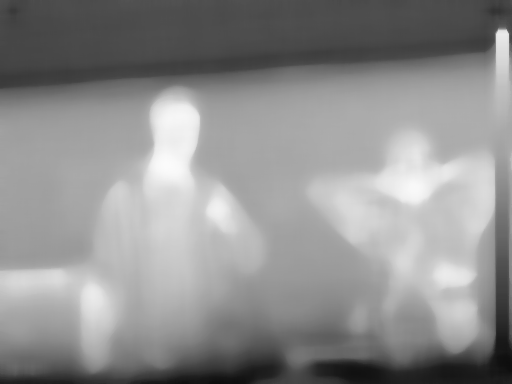


gauss_2


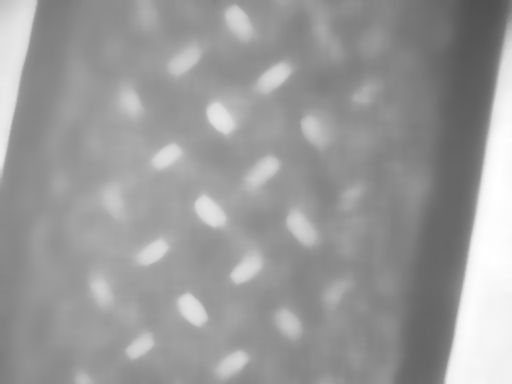


poisson_1


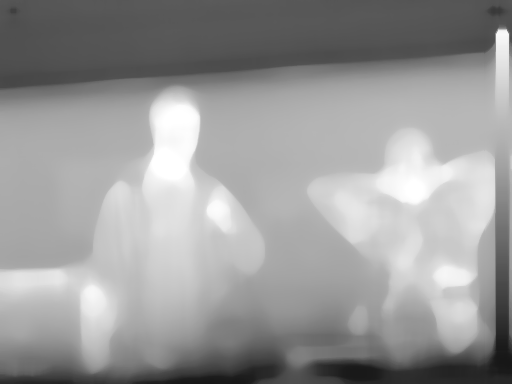


poisson_2


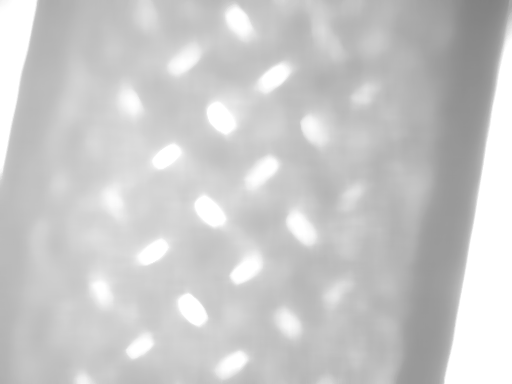


sp_1


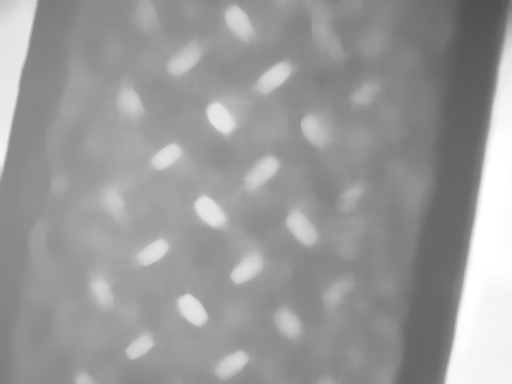


sp_2


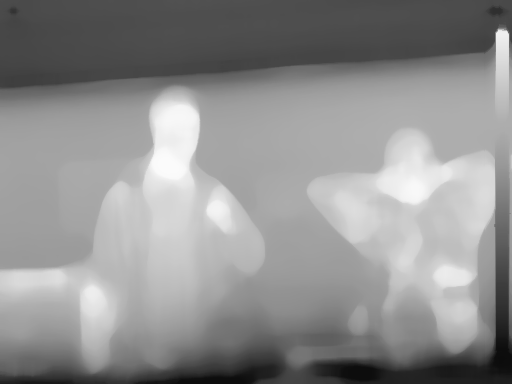


lab1_zdjecie


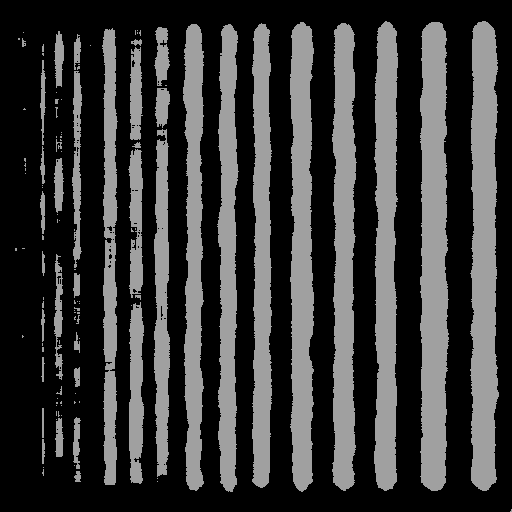

In [ ]:
from PIL import Image, ImageFilter

kernel_sizes = [5,11, 21]
file_names = ['gauss_1', 'gauss_2', 'poisson_1', 'poisson_2', 'sp_1', 'sp_2', 'lab1_zdjecie']
for l in kernel_sizes:
  print(f'Kernel size = {l}x{l}')
  for f in file_names:
    print(f'\n{f}')
    path = r"/content/" + f + ".png"
    image = Image.open(path)
    image = image.filter(ImageFilter.MedianFilter(size=l))
    display(image)
  print('\n\n\n')

Opisz swoje spostrzeżenia. Czy wszystkie filtry tak samo zachowują krawęzie? 

Po zastosowaniu filtra medianowego obrazu sprawiają wrażenie "zmiękczonych". Po szumach nałożonych w poprzednim zadaniu nie ma śladu. Krawędzie są wyraźne, jednakże kontury obiektów straciły swoją dokładność/szczegółowość. Im większy kernel size tym efekt stawał się mocniejszy.

Image filters can be used to reduce the amount of noise in an image and to enhance the edges in an image.

## Zadanie 3 - Wyznaczanie krawędzi

Trzy dowolne obrazy pozyskane w trakcie laboratorium 2 zamień na obrazy monochromatyczne, a następnie wykonaj poniższe polecenia. 

In [ ]:
dsize = (512, 384)
img_1 = cv2.resize(cv2.imread('/content/mikroskop.png', cv2.IMREAD_GRAYSCALE), dsize)
img_2 = cv2.resize(cv2.imread('/content/termowizja.jpg', cv2.IMREAD_GRAYSCALE), dsize)
img_3 = cv2.resize(cv2.imread('/content/uv.png', cv2.IMREAD_GRAYSCALE), dsize)


### a) Detekcja krawędzi metodą Sobela. 
  
Zastosuj filtr Sobela do wybranych obrazów


termowizja.jpg


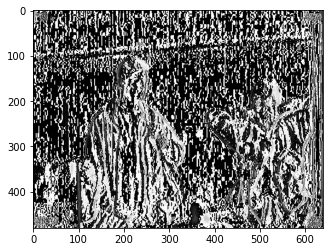


uv.png


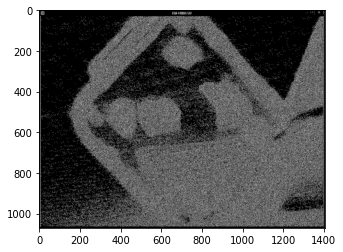


mikroskop.png


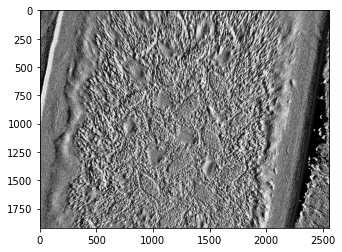

In [ ]:
from scipy import signal, ndimage, misc
import matplotlib.pyplot as plt
import imageio
from PIL import Image

file_names = ['termowizja.jpg', 'uv.png', 'mikroskop.png']
for f in file_names:
  print(f'\n{f}')
  path = r"/content/" + f
  image = Image.open(path).convert('L')
  image = ndimage.sobel(image, mode='mirror')
  plt.imshow(image, cmap = plt.cm.gray) 
  plt.show()

### b) Detekcja krawędzi metodą Laplace'a. 
  
Zastosuj filtr Laplace'a do wybranych obrazów


termowizja.jpg


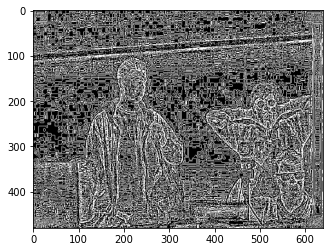


uv.png


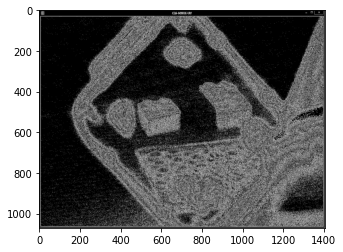


mikroskop.png


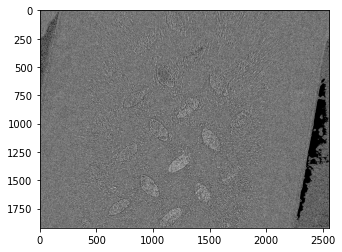

In [ ]:
file_names = ['termowizja.jpg', 'uv.png', 'mikroskop.png']
for f in file_names:
  print(f'\n{f}')
  path = r"/content/" + f
  image = Image.open(path).convert('L')
  image = ndimage.laplace(image)
  plt.imshow(image, cmap = plt.cm.gray) 
  plt.show()

### c) Detekcja krawędzi metodą Canny'ego. 
  
Zastosuj filtr Canne'ego do wybranych obrazów

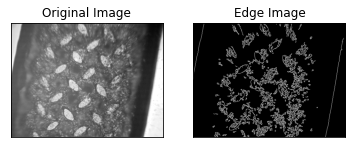

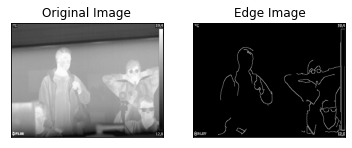

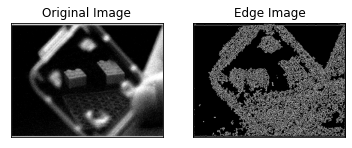

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

file_names = [img_1, img_2, img_3]
for f in file_names:
  img = f
  edges = cv.Canny(img,50,200)
  plt.subplot(121),plt.imshow(img,cmap = 'gray')
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(edges,cmap = 'gray')
  plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
  plt.show()

Opisz swoje spostrzeżenia po porównaniu 3 metod wyznaczania krawędzi.

Metodą cannego dała najlepsze wyniki. Na obrazie przedstawiającym 3 postaci kontury są bardzo wyraźne i przejrzyste(reszata obrazu po zastosowaniu filtra jest jednolicie czarna. Metoda Laplace dla tego samego orbrazu także dała obiecujące wyniki. Kontury postaci są wyraźne, jednak poza konturami na obrazie jest dużo "szumu". Metoda Sobela dała nagorsze wyniki. Kontury są mało wyraźne i obraz jest nieprzjrzysty przez dużą ilość artefaktów.